## Dataset: https://archive.ics.uci.edu/ml/datasets/gas+sensor+array+under+dynamic+gas+mixtures#

In [50]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor

In [2]:
data_path = "D:/00. FSOFT/01. Project/AIML/02. Gas Leak Detection POC/Source code/Notebook/data/"
co_filename = "ethylene_CO.txt"
methane_filename = "ethylene_methane.txt"

In [3]:
# ethylene methane (EM) data 
# 'ethylene_CO.txt': contains the recordings from the sensors when exposed to mixtures of Ethylene and CO in air.
em_df = pd.read_csv(os.path.join(data_path, methane_filename), skiprows=1, header=None, delim_whitespace=True)
em_df.columns = ['Time', 'Methane_conc', 'Ethylene_conc', 
                 'TGS2602-1', 'TGS2602-2', 'TGS2600-1', 'TGS2600-2', 
                 'TGS2610-1', 'TGS2610-2', 'TGS2620-1', 'TGS2620-2',
                 'TGS2602-3', 'TGS2602-4', 'TGS2600-3', 'TGS2600-4', 
                 'TGS2610-3', 'TGS2610-4', 'TGS2620-3', 'TGS2620-4']
print("Number of samples: ", em_df.shape[0])
em_df.head()

Number of samples:  4178504


,Time,Methane_conc,Ethylene_conc,TGS2602-1,TGS2602-2,TGS2600-1,TGS2600-2,TGS2610-1,TGS2610-2,TGS2620-1,TGS2620-2,TGS2602-3,TGS2602-4,TGS2600-3,TGS2600-4,TGS2610-3,TGS2610-4,TGS2620-3,TGS2620-4
0,0.00,0.0,0.0,-41.98,2067.64,-37.13,2.28,8.63,-26.62,-8.46,-0.33,3437.73,2728.14,4054.03,4007.89,4478.27,5056.98,3639.09,3128.49
1,0.01,0.0,0.0,-46.50,2067.88,-28.56,13.69,-12.35,-25.81,-5.04,-5.04,3432.44,2734.47,4038.62,4019.40,4496.72,5051.81,3636.97,3115.03
2,0.02,0.0,0.0,-36.16,2055.81,-10.89,8.63,-2.93,-30.34,-9.27,-2.12,3438.61,2719.97,4030.92,4025.48,4489.54,5057.35,3641.81,3105.24
3,0.03,0.0,0.0,-50.36,2053.68,-31.96,-0.65,-8.29,-21.60,7.98,2.28,3429.51,2720.50,4040.22,4000.87,4485.44,5049.60,3642.72,3124.84
4,0.04,0.0,0.0,-37.30,2081.17,-36.16,3.26,5.05,-26.14,-7.48,-0.65,3436.85,2719.71,4029.64,4007.25,4499.12,5057.35,3674.30,3147.59


### Visualize raw data

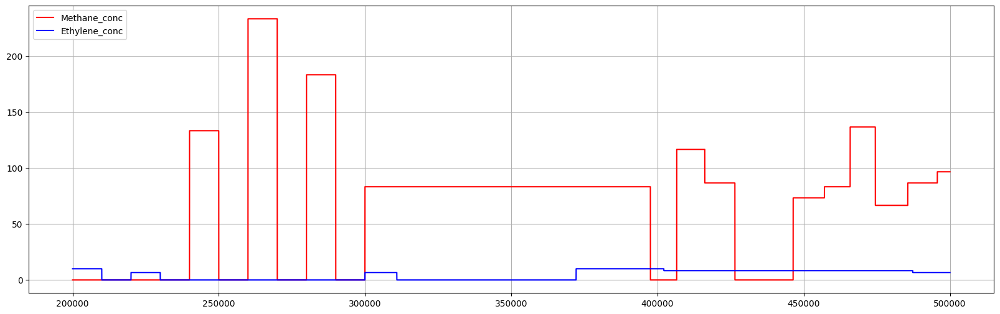

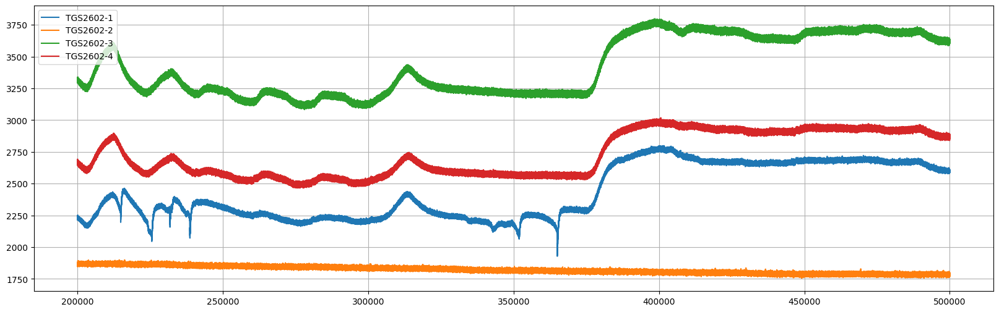

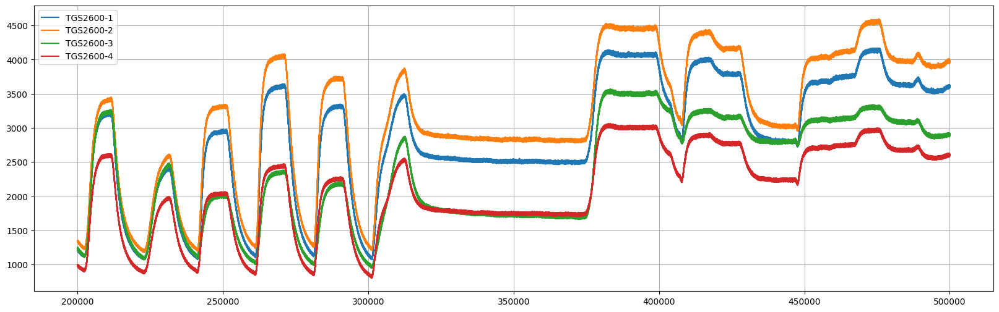

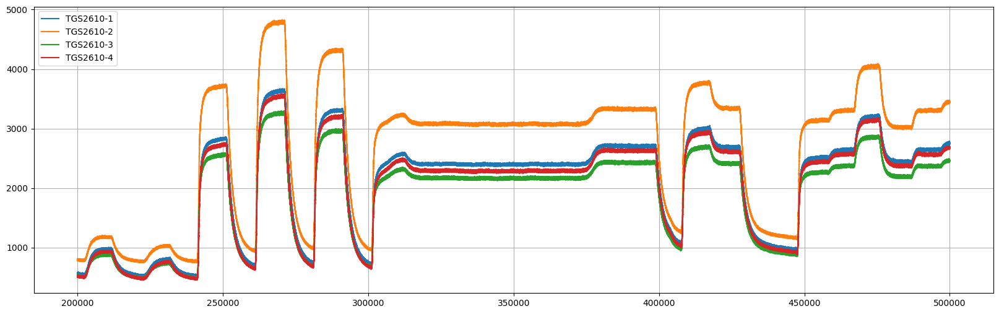

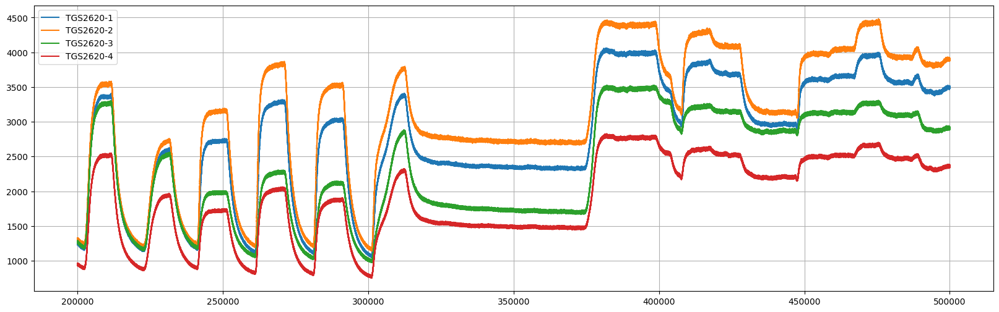

In [4]:
start = 200000
end = 500000


fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
em_df[start:end].plot(y='Methane_conc', color='red', ax=ax)
em_df[start:end].plot(y='Ethylene_conc', color='blue', ax=ax)
plt.legend(loc='upper left')
plt.grid()
plt.show()

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
em_df[start:end].plot(y='TGS2602-1', ax=ax)
em_df[start:end].plot(y='TGS2602-2', ax=ax)
em_df[start:end].plot(y='TGS2602-3', ax=ax)
em_df[start:end].plot(y='TGS2602-4', ax=ax)
plt.legend(loc='upper left')
plt.grid()
plt.show()

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
em_df[start:end].plot(y='TGS2600-1', ax=ax)
em_df[start:end].plot(y='TGS2600-2', ax=ax)
em_df[start:end].plot(y='TGS2600-3', ax=ax)
em_df[start:end].plot(y='TGS2600-4', ax=ax)
plt.legend(loc='upper left')
plt.grid()
plt.show()

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
em_df[start:end].plot(y='TGS2610-1', ax=ax)
em_df[start:end].plot(y='TGS2610-2', ax=ax)
em_df[start:end].plot(y='TGS2610-3', ax=ax)
em_df[start:end].plot(y='TGS2610-4', ax=ax)
plt.legend(loc='upper left')
plt.grid()
plt.show()

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
em_df[start:end].plot(y='TGS2620-1', ax=ax)
em_df[start:end].plot(y='TGS2620-2', ax=ax)
em_df[start:end].plot(y='TGS2620-3', ax=ax)
em_df[start:end].plot(y='TGS2620-4', ax=ax)
plt.legend(loc='upper left')
plt.grid()
plt.show()

In [5]:
# create timedate index 
processed_df = em_df
processed_df["Time"] = pd.to_timedelta(processed_df["Time"], unit='s')
processed_df = processed_df.set_index('Time')

# min-max normalization
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(processed_df.values)
scaled_df = pd.DataFrame(scaled_df, columns=processed_df.columns)
scaled_df.index = processed_df.index

# downsampling to 1 second interval
scaled_df = scaled_df.resample('1s').mean()

print("Number of samples after normalization: ", scaled_df.shape[0])
scaled_df.head()

Number of samples after normalization:  41791


,Methane_conc,Ethylene_conc,TGS2602-1,TGS2602-2,TGS2600-1,TGS2600-2,TGS2610-1,TGS2610-2,TGS2620-1,TGS2620-2,TGS2602-3,TGS2602-4,TGS2600-3,TGS2600-4,TGS2610-3,TGS2610-4,TGS2620-3,TGS2620-4
Time,,,,,,,,,,,,,,,,,,
0 days 00:00:00,0.0,0.0,0.003537,0.060225,0.004388,0.003646,0.004474,0.003894,0.003171,0.004008,0.316854,0.315907,0.804811,0.983190,0.987900,0.990329,0.732187,0.800195
0 days 00:00:01,0.0,0.0,0.015253,0.060313,0.021894,0.020657,0.022671,0.022033,0.022454,0.024445,0.316719,0.313996,0.804733,0.983904,0.988289,0.990550,0.731732,0.799344
0 days 00:00:02,0.0,0.0,0.072100,0.060531,0.083054,0.080727,0.094944,0.104740,0.089697,0.096243,0.317078,0.314391,0.804935,0.983568,0.988666,0.990579,0.731897,0.800045
0 days 00:00:03,0.0,0.0,0.182533,0.060588,0.194089,0.190400,0.251209,0.280799,0.208504,0.223270,0.315925,0.315307,0.805401,0.983759,0.989340,0.991888,0.732511,0.800100
0 days 00:00:04,0.0,0.0,0.313134,0.060360,0.336924,0.333668,0.462085,0.497149,0.357923,0.384184,0.314577,0.314621,0.804955,0.983521,0.990394,0.992716,0.732994,0.800905


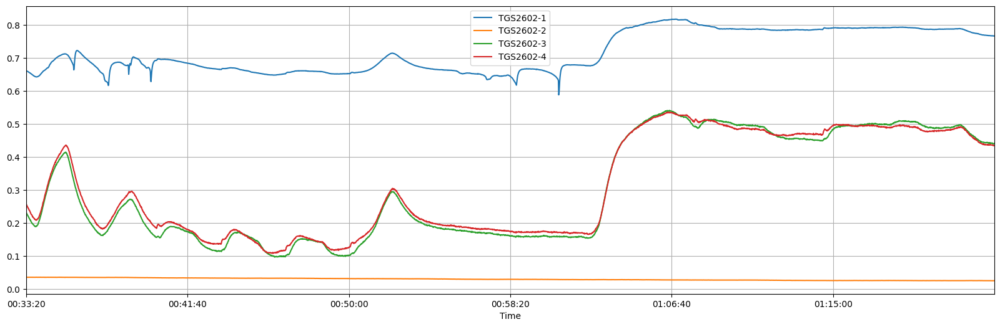

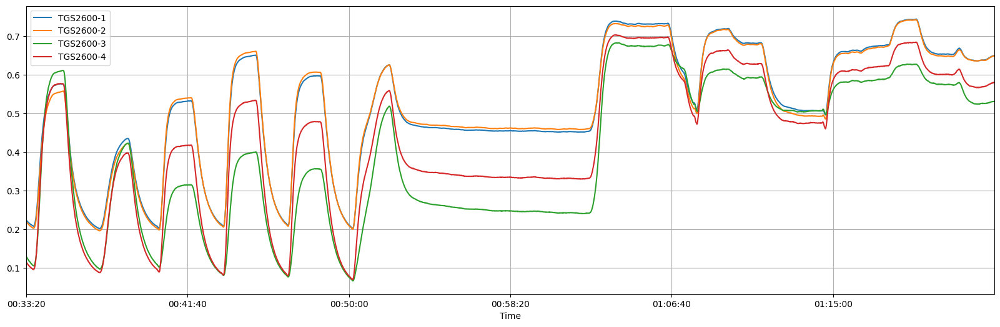

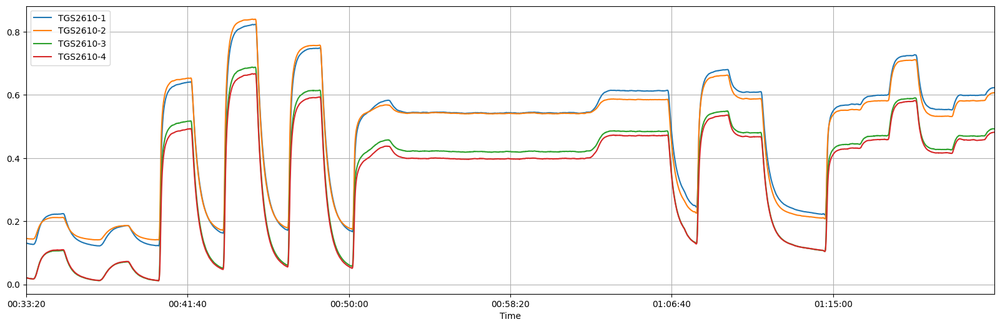

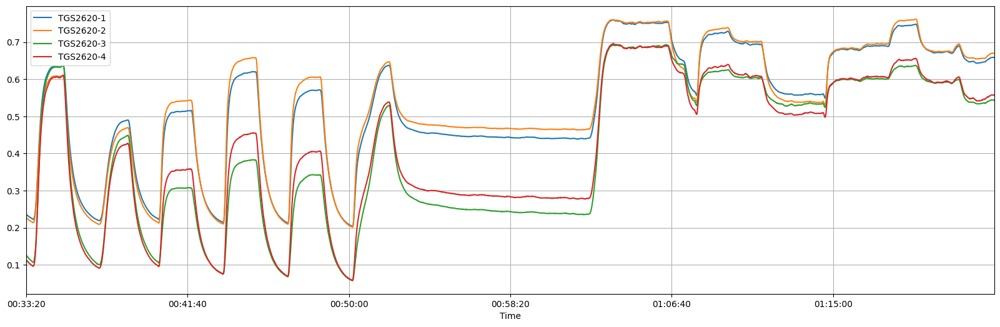

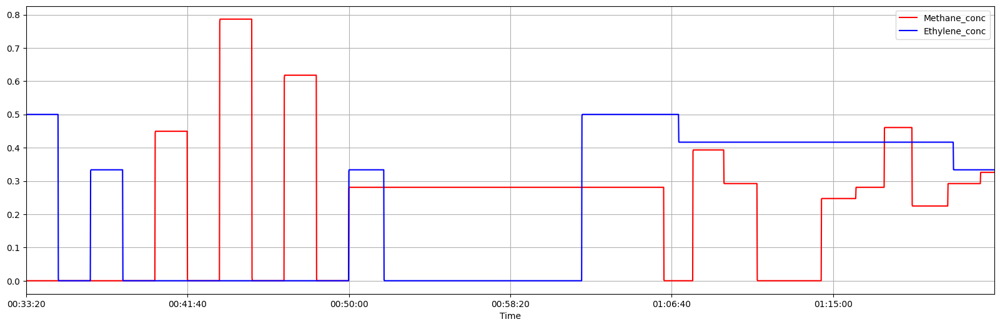

In [6]:
start = 2000
end = 5000


fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
scaled_df[start:end].plot(y='TGS2602-1', ax=ax)
scaled_df[start:end].plot(y='TGS2602-2', ax=ax)
scaled_df[start:end].plot(y='TGS2602-3', ax=ax)
scaled_df[start:end].plot(y='TGS2602-4', ax=ax)
plt.grid()
plt.show()

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
scaled_df[start:end].plot(y='TGS2600-1', ax=ax)
scaled_df[start:end].plot(y='TGS2600-2', ax=ax)
scaled_df[start:end].plot(y='TGS2600-3', ax=ax)
scaled_df[start:end].plot(y='TGS2600-4', ax=ax)
plt.grid()
plt.show()

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
scaled_df[start:end].plot(y='TGS2610-1', ax=ax)
scaled_df[start:end].plot(y='TGS2610-2', ax=ax)
scaled_df[start:end].plot(y='TGS2610-3', ax=ax)
scaled_df[start:end].plot(y='TGS2610-4', ax=ax)
plt.grid()
plt.show()

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
scaled_df[start:end].plot(y='TGS2620-1', ax=ax)
scaled_df[start:end].plot(y='TGS2620-2', ax=ax)
scaled_df[start:end].plot(y='TGS2620-3', ax=ax)
scaled_df[start:end].plot(y='TGS2620-4', ax=ax)
plt.grid()
plt.show()

fig = plt.figure(figsize=(20, 6))
ax = fig.add_subplot(111)
scaled_df[start:end].plot(y='Methane_conc', color='red', ax=ax)
scaled_df[start:end].plot(y='Ethylene_conc', color='blue', ax=ax)
plt.grid()
plt.show()

In [7]:
scaled_df['Label'] = 0

In [8]:
scaled_df.head()

,Methane_conc,Ethylene_conc,TGS2602-1,TGS2602-2,TGS2600-1,TGS2600-2,TGS2610-1,TGS2610-2,TGS2620-1,TGS2620-2,TGS2602-3,TGS2602-4,TGS2600-3,TGS2600-4,TGS2610-3,TGS2610-4,TGS2620-3,TGS2620-4,Label
Time,,,,,,,,,,,,,,,,,,,
0 days 00:00:00,0.0,0.0,0.003537,0.060225,0.004388,0.003646,0.004474,0.003894,0.003171,0.004008,0.316854,0.315907,0.804811,0.983190,0.987900,0.990329,0.732187,0.800195,0
0 days 00:00:01,0.0,0.0,0.015253,0.060313,0.021894,0.020657,0.022671,0.022033,0.022454,0.024445,0.316719,0.313996,0.804733,0.983904,0.988289,0.990550,0.731732,0.799344,0
0 days 00:00:02,0.0,0.0,0.072100,0.060531,0.083054,0.080727,0.094944,0.104740,0.089697,0.096243,0.317078,0.314391,0.804935,0.983568,0.988666,0.990579,0.731897,0.800045,0
0 days 00:00:03,0.0,0.0,0.182533,0.060588,0.194089,0.190400,0.251209,0.280799,0.208504,0.223270,0.315925,0.315307,0.805401,0.983759,0.989340,0.991888,0.732511,0.800100,0
0 days 00:00:04,0.0,0.0,0.313134,0.060360,0.336924,0.333668,0.462085,0.497149,0.357923,0.384184,0.314577,0.314621,0.804955,0.983521,0.990394,0.992716,0.732994,0.800905,0


In [9]:
scaled_df.columns 

Index(['Methane_conc', 'Ethylene_conc', 'TGS2602-1', 'TGS2602-2', 'TGS2600-1',
       'TGS2600-2', 'TGS2610-1', 'TGS2610-2', 'TGS2620-1', 'TGS2620-2',
       'TGS2602-3', 'TGS2602-4', 'TGS2600-3', 'TGS2600-4', 'TGS2610-3',
       'TGS2610-4', 'TGS2620-3', 'TGS2620-4', 'Label'],
      dtype='object')

In [10]:
#  Label = 0,1,2,3 => air(0) ~ Methane_conc = 0 & Ethylene_conc =0
#                     Methane(1) ~ Methan >0, Ethy =0
#                     Ethane(2) ~ ethan >0, Methy =0
#                     Mix(3) ~ ethan >0, Methy =>

## Create Lable column for classification 

In [11]:
df_new = scaled_df.filter(['Methane_conc', 'Ethylene_conc','Label'], axis=1)
df_new

,Methane_conc,Ethylene_conc,Label
Time,,,
0 days 00:00:00,0.0,0.0,0
0 days 00:00:01,0.0,0.0,0
0 days 00:00:02,0.0,0.0,0
0 days 00:00:03,0.0,0.0,0
0 days 00:00:04,0.0,0.0,0
...,...,...,...
0 days 11:36:26,0.0,0.0,0
0 days 11:36:27,0.0,0.0,0
0 days 11:36:28,0.0,0.0,0


In [12]:
 df_new['Methane_conc'].values 

array([0., 0., 0., ..., 0., 0., 0.])

In [13]:
conditions = [
    (df_new['Methane_conc'] == 0) & (df_new['Ethylene_conc'] == 0) ,
    (df_new['Methane_conc'] > 0) & (df_new['Ethylene_conc'] == 0),
    (df_new['Methane_conc'] == 0) & (df_new['Ethylene_conc'] > 0),
    (df_new['Methane_conc'] > 0) & (df_new['Ethylene_conc'] > 0),
    ]

labels = [0,1,2,3]
   
df_new['Label'] = np.select(conditions, labels, default= 0)

In [14]:
df_new.Label.value_counts()

0    13650
1    10045
2     9571
3     8525
Name: Label, dtype: int64

In [15]:
df_label = df_new.Label
df_label 

Time
0 days 00:00:00    0
0 days 00:00:01    0
0 days 00:00:02    0
0 days 00:00:03    0
0 days 00:00:04    0
                  ..
0 days 11:36:26    0
0 days 11:36:27    0
0 days 11:36:28    0
0 days 11:36:29    0
0 days 11:36:30    0
Freq: S, Name: Label, Length: 41791, dtype: int32

In [16]:
df_label.to_csv('label_data.csv')

In [17]:
#Test -Write funtion & apply lampda

In [18]:
# def CalDiscrete(value, open):
#     # Alot = >1%
#     # Normal = 0.2% ~ 1%
#     # Alittle = 0.01% ~ 0.2%
#     # Flat = 0% ~ 0.01%
#     if(value >= open*0.01):
#         return 'up_alot'
#     elif(value <= open*-0.01):
#         return 'down_alot'
#     elif(value >= open*0.002):
#         return 'up'
#     elif(value <= open*-0.002):
#         return 'down'
#     elif(value >= open*0.0001):
#         return 'up_alittle'
#     elif(value <= open*-0.0001):
#         return 'down_alittle'
#     else:
#         return 'flat'

In [19]:
# df_input['movement'] = df_input["close"].diff()
# df_input['discrete'] = df_input.apply(lambda row: CalDiscrete(row['movement'], row["close"]), axis=1) 

In [20]:
df_json = em_df.head(100).to_json('jd1')


## MODELING

In [21]:
scaled_df

,Methane_conc,Ethylene_conc,TGS2602-1,TGS2602-2,TGS2600-1,TGS2600-2,TGS2610-1,TGS2610-2,TGS2620-1,TGS2620-2,TGS2602-3,TGS2602-4,TGS2600-3,TGS2600-4,TGS2610-3,TGS2610-4,TGS2620-3,TGS2620-4,Label
Time,,,,,,,,,,,,,,,,,,,
0 days 00:00:00,0.0,0.0,0.003537,0.060225,0.004388,0.003646,0.004474,0.003894,0.003171,0.004008,0.316854,0.315907,0.804811,0.983190,0.987900,0.990329,0.732187,0.800195,0
0 days 00:00:01,0.0,0.0,0.015253,0.060313,0.021894,0.020657,0.022671,0.022033,0.022454,0.024445,0.316719,0.313996,0.804733,0.983904,0.988289,0.990550,0.731732,0.799344,0
0 days 00:00:02,0.0,0.0,0.072100,0.060531,0.083054,0.080727,0.094944,0.104740,0.089697,0.096243,0.317078,0.314391,0.804935,0.983568,0.988666,0.990579,0.731897,0.800045,0
0 days 00:00:03,0.0,0.0,0.182533,0.060588,0.194089,0.190400,0.251209,0.280799,0.208504,0.223270,0.315925,0.315307,0.805401,0.983759,0.989340,0.991888,0.732511,0.800100,0
0 days 00:00:04,0.0,0.0,0.313134,0.060360,0.336924,0.333668,0.462085,0.497149,0.357923,0.384184,0.314577,0.314621,0.804955,0.983521,0.990394,0.992716,0.732994,0.800905,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 11:36:26,0.0,0.0,0.705209,0.004029,0.235281,0.231714,0.209677,0.220941,0.235605,0.238492,0.243525,0.261376,0.098662,0.100732,0.103058,0.089794,0.090858,0.089040,0
0 days 11:36:27,0.0,0.0,0.702725,0.003879,0.237738,0.233858,0.216194,0.229861,0.240045,0.244218,0.234681,0.252921,0.102079,0.104314,0.110756,0.094675,0.095738,0.093919,0
0 days 11:36:28,0.0,0.0,0.699790,0.003861,0.240817,0.236918,0.223562,0.239158,0.245409,0.249878,0.227571,0.245878,0.104746,0.107608,0.118122,0.100575,0.101811,0.099553,0


In [22]:
X = scaled_df.copy()
X

,Methane_conc,Ethylene_conc,TGS2602-1,TGS2602-2,TGS2600-1,TGS2600-2,TGS2610-1,TGS2610-2,TGS2620-1,TGS2620-2,TGS2602-3,TGS2602-4,TGS2600-3,TGS2600-4,TGS2610-3,TGS2610-4,TGS2620-3,TGS2620-4,Label
Time,,,,,,,,,,,,,,,,,,,
0 days 00:00:00,0.0,0.0,0.003537,0.060225,0.004388,0.003646,0.004474,0.003894,0.003171,0.004008,0.316854,0.315907,0.804811,0.983190,0.987900,0.990329,0.732187,0.800195,0
0 days 00:00:01,0.0,0.0,0.015253,0.060313,0.021894,0.020657,0.022671,0.022033,0.022454,0.024445,0.316719,0.313996,0.804733,0.983904,0.988289,0.990550,0.731732,0.799344,0
0 days 00:00:02,0.0,0.0,0.072100,0.060531,0.083054,0.080727,0.094944,0.104740,0.089697,0.096243,0.317078,0.314391,0.804935,0.983568,0.988666,0.990579,0.731897,0.800045,0
0 days 00:00:03,0.0,0.0,0.182533,0.060588,0.194089,0.190400,0.251209,0.280799,0.208504,0.223270,0.315925,0.315307,0.805401,0.983759,0.989340,0.991888,0.732511,0.800100,0
0 days 00:00:04,0.0,0.0,0.313134,0.060360,0.336924,0.333668,0.462085,0.497149,0.357923,0.384184,0.314577,0.314621,0.804955,0.983521,0.990394,0.992716,0.732994,0.800905,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 11:36:26,0.0,0.0,0.705209,0.004029,0.235281,0.231714,0.209677,0.220941,0.235605,0.238492,0.243525,0.261376,0.098662,0.100732,0.103058,0.089794,0.090858,0.089040,0
0 days 11:36:27,0.0,0.0,0.702725,0.003879,0.237738,0.233858,0.216194,0.229861,0.240045,0.244218,0.234681,0.252921,0.102079,0.104314,0.110756,0.094675,0.095738,0.093919,0
0 days 11:36:28,0.0,0.0,0.699790,0.003861,0.240817,0.236918,0.223562,0.239158,0.245409,0.249878,0.227571,0.245878,0.104746,0.107608,0.118122,0.100575,0.101811,0.099553,0


In [23]:
X.drop(['Methane_conc', 'Ethylene_conc', 'Label'], axis=1, inplace=True)

In [24]:
X

,TGS2602-1,TGS2602-2,TGS2600-1,TGS2600-2,TGS2610-1,TGS2610-2,TGS2620-1,TGS2620-2,TGS2602-3,TGS2602-4,TGS2600-3,TGS2600-4,TGS2610-3,TGS2610-4,TGS2620-3,TGS2620-4
Time,,,,,,,,,,,,,,,,
0 days 00:00:00,0.003537,0.060225,0.004388,0.003646,0.004474,0.003894,0.003171,0.004008,0.316854,0.315907,0.804811,0.983190,0.987900,0.990329,0.732187,0.800195
0 days 00:00:01,0.015253,0.060313,0.021894,0.020657,0.022671,0.022033,0.022454,0.024445,0.316719,0.313996,0.804733,0.983904,0.988289,0.990550,0.731732,0.799344
0 days 00:00:02,0.072100,0.060531,0.083054,0.080727,0.094944,0.104740,0.089697,0.096243,0.317078,0.314391,0.804935,0.983568,0.988666,0.990579,0.731897,0.800045
0 days 00:00:03,0.182533,0.060588,0.194089,0.190400,0.251209,0.280799,0.208504,0.223270,0.315925,0.315307,0.805401,0.983759,0.989340,0.991888,0.732511,0.800100
0 days 00:00:04,0.313134,0.060360,0.336924,0.333668,0.462085,0.497149,0.357923,0.384184,0.314577,0.314621,0.804955,0.983521,0.990394,0.992716,0.732994,0.800905
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 11:36:26,0.705209,0.004029,0.235281,0.231714,0.209677,0.220941,0.235605,0.238492,0.243525,0.261376,0.098662,0.100732,0.103058,0.089794,0.090858,0.089040
0 days 11:36:27,0.702725,0.003879,0.237738,0.233858,0.216194,0.229861,0.240045,0.244218,0.234681,0.252921,0.102079,0.104314,0.110756,0.094675,0.095738,0.093919
0 days 11:36:28,0.699790,0.003861,0.240817,0.236918,0.223562,0.239158,0.245409,0.249878,0.227571,0.245878,0.104746,0.107608,0.118122,0.100575,0.101811,0.099553


In [25]:
y = df_new['Label']
y.head()
             

Time
0 days 00:00:00    0
0 days 00:00:01    0
0 days 00:00:02    0
0 days 00:00:03    0
0 days 00:00:04    0
Freq: S, Name: Label, dtype: int32

In [26]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score,KFold,train_test_split
from sklearn.metrics import accuracy_score,precision_score,confusion_matrix,classification_report

## Train/Test Split

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [28]:
X_train.head()

,TGS2602-1,TGS2602-2,TGS2600-1,TGS2600-2,TGS2610-1,TGS2610-2,TGS2620-1,TGS2620-2,TGS2602-3,TGS2602-4,TGS2600-3,TGS2600-4,TGS2610-3,TGS2610-4,TGS2620-3,TGS2620-4
Time,,,,,,,,,,,,,,,,
0 days 04:37:14,0.672708,0.014772,0.213679,0.211537,0.175821,0.183211,0.204745,0.203642,0.196937,0.213852,0.071789,0.075985,0.067090,0.060927,0.053294,0.055680
0 days 01:10:54,0.787646,0.027726,0.682684,0.679074,0.608925,0.587426,0.693945,0.701682,0.495260,0.485463,0.592770,0.627950,0.480513,0.468174,0.604300,0.608847
0 days 02:31:25,0.704425,0.016695,0.230794,0.226037,0.131654,0.148109,0.245032,0.235391,0.319234,0.341245,0.137055,0.118947,0.022582,0.022480,0.135190,0.122208
0 days 05:12:10,0.888056,0.014326,0.971506,0.957083,0.734802,0.717753,0.987819,0.984959,0.767978,0.759572,0.984238,0.982592,0.609128,0.596025,0.990647,0.985454
0 days 00:03:33,0.599651,0.047908,0.506452,0.515172,0.610202,0.613104,0.486334,0.513072,0.042392,0.045202,0.298704,0.405814,0.491971,0.481962,0.283182,0.338853


In [29]:
y_train.value_counts()

0    9584
1    7042
2    6671
3    5956
Name: Label, dtype: int64

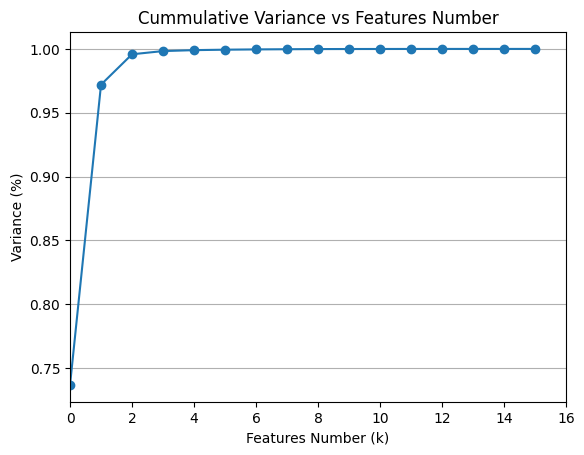

In [30]:
pca = PCA().fit(X)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker = 'o')
plt.xlabel('Features Number (k)')
plt.ylabel('Variance (%)')
plt.title('Cummulative Variance vs Features Number')
plt.xlim([0, 16])
plt.grid(axis = 'y')
plt.show()

In [31]:
scaled_df.Label 

Time
0 days 00:00:00    0
0 days 00:00:01    0
0 days 00:00:02    0
0 days 00:00:03    0
0 days 00:00:04    0
                  ..
0 days 11:36:26    0
0 days 11:36:27    0
0 days 11:36:28    0
0 days 11:36:29    0
0 days 11:36:30    0
Freq: S, Name: Label, Length: 41791, dtype: int64

In [32]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=df_new['Label'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

## Apply PCA for FE

In [73]:
pca = PCA(n_components=3)

In [74]:
pca.fit(X_train)

PCA(n_components=3)

In [75]:
X_train = pca.transform(X_train)

In [76]:
X_test = pca.transform(X_test)

In [77]:
X_train

array([[-1.04489311, -0.08542217,  0.02540685],
       [ 0.67700844,  0.00531579, -0.00824262],
       [-0.94292872,  0.11976903, -0.05019922],
       ...,
       [-0.2756331 , -0.05738153, -0.13523003],
       [-0.82147613,  0.11750697,  0.14473063],
       [-0.75534066, -0.12047301,  0.09135824]])

In [78]:
X_test

array([[-0.84475735, -0.10465809,  0.03980109],
       [ 0.67121869, -0.76741021,  0.15447892],
       [ 1.07015464, -0.20187467, -0.03682305],
       ...,
       [ 0.71713521, -0.42925937, -0.127417  ],
       [-1.2072393 , -0.0387804 , -0.06213909],
       [ 0.29525434, -0.46981729, -0.03443227]])

In [79]:
y_train 

Time
0 days 04:37:14    0
0 days 01:10:54    3
0 days 02:31:25    0
0 days 05:12:10    3
0 days 00:03:33    2
                  ..
0 days 01:44:25    1
0 days 03:08:04    1
0 days 10:35:58    2
0 days 00:14:20    0
0 days 04:23:15    0
Name: Label, Length: 29253, dtype: int32

In [80]:
y_train

Time
0 days 04:37:14    0
0 days 01:10:54    3
0 days 02:31:25    0
0 days 05:12:10    3
0 days 00:03:33    2
                  ..
0 days 01:44:25    1
0 days 03:08:04    1
0 days 10:35:58    2
0 days 00:14:20    0
0 days 04:23:15    0
Name: Label, Length: 29253, dtype: int32

## Random Forest Algorithm

In [81]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators= 10)
model = clf.fit(X_train,y_train)

In [82]:
y_pred = model.predict(X_test)
y_pred

array([0, 1, 3, ..., 1, 0, 1])

In [83]:
target_names = ['Air', 'Methane', 'Ethane', 'Mixture']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

         Air       0.92      0.94      0.93      4066
     Methane       0.95      0.94      0.95      3003
      Ethane       0.91      0.90      0.90      2900
     Mixture       0.94      0.94      0.94      2569

    accuracy                           0.93     12538
   macro avg       0.93      0.93      0.93     12538
weighted avg       0.93      0.93      0.93     12538



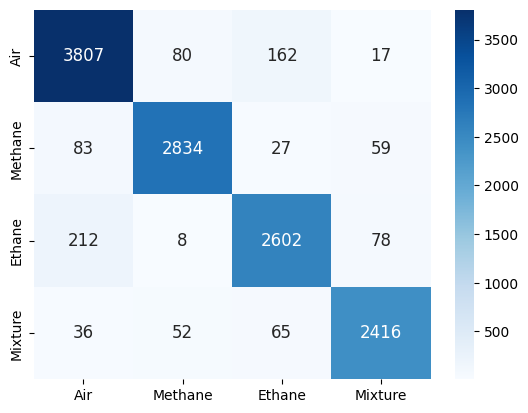

In [84]:
#Confusion Matrix
import seaborn as sns 
cf_matrix = confusion_matrix(y_test, y_pred)

sns.heatmap(cf_matrix, annot=True, annot_kws={"size": 12},cmap='Blues',fmt="d",xticklabels=target_names,yticklabels=target_names)

plt.show()

## SVM Algorithm

In [85]:
from sklearn import svm

In [86]:
clf_svm = svm.SVC()
model_svm = clf_svm.fit(X_train,y_train) 

In [87]:
y_pred_svm = model_svm.predict(X_test)
y_pred_svm 

array([0, 1, 3, ..., 1, 0, 1])

In [88]:
target_names = ['Air', 'Methane', 'Ethane', 'Mixture']
print(classification_report(y_test, y_pred_svm, target_names=target_names))

              precision    recall  f1-score   support

         Air       0.79      0.83      0.81      4066
     Methane       0.83      0.85      0.84      3003
      Ethane       0.81      0.74      0.77      2900
     Mixture       0.86      0.85      0.86      2569

    accuracy                           0.82     12538
   macro avg       0.82      0.82      0.82     12538
weighted avg       0.82      0.82      0.82     12538



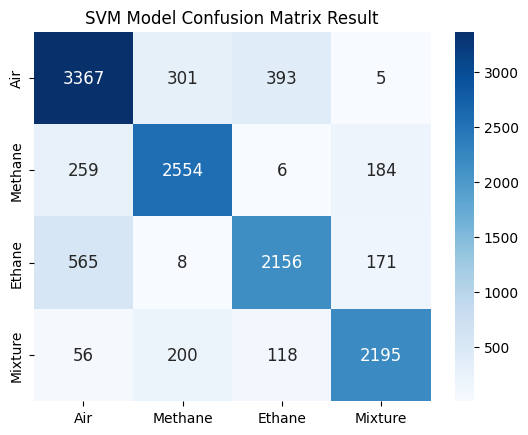

In [89]:
#Confusion Matrix
import seaborn as sns 
cf_matrix = confusion_matrix(y_test, y_pred_svm)

sns.heatmap(cf_matrix, annot=True, annot_kws={"size": 12},cmap='Blues',fmt="d",xticklabels=target_names,yticklabels=target_names)
plt.title('SVM Model Confusion Matrix Result')
plt.show()

## Model Comparison

In [90]:
from sklearn.model_selection import cross_val_score
models =[
    RandomForestClassifier(n_estimators=100),
    SVC(kernel='linear')
]
CV =5
cv_df = pd.DataFrame(index =range(len(models)))
entries =[]
for model in models:
    model_name = model.__class__.__name__
    accuracies = cross_val_score(model,X_test,y_test,scoring = 'accuracy', cv= CV)
    print(accuracies)
    entries.append([model_name,accuracies.mean()])



[0.89393939 0.90590112 0.89712919 0.90905465 0.9102513 ]
[0.80143541 0.79665072 0.7930622  0.80534503 0.79936179]


In [91]:
cv_df = pd.DataFrame(entries, columns = ['model_name', 'accuracies'])
cv_df
            

,model_name,accuracies
0,RandomForestClassifier,0.903255
1,SVC,0.799171


Text(0.5, 1.0, 'Model Accuracy Comparision ')

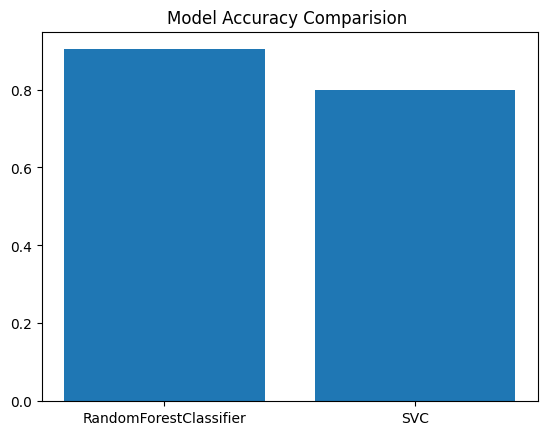

In [92]:
plt.bar(cv_df.model_name, cv_df.accuracies)
plt.title('Model Accuracy Comparision ')